In [1]:
import json
import numpy as np
import glob
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import pandas as pd
from matplotlib.colors import ListedColormap
import random

In [2]:
# matplotlib 한글 폰트 깨쥠 문제 해결
import matplotlib.font_manager as fm
font_path = '/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc'
fontprop = fm.FontProperties(fname=font_path)

#### 파일 업로드

In [3]:
# 경로 설정

data_path = '/workspace/#Ub370#Uc774#Ud130/Data'

train_img_path = '/workspace/#Ub370#Uc774#Ud130/Data/img/train/'
val_img_path = '/workspace/#Ub370#Uc774#Ud130/Data/img/val/'

train_json_path = '/workspace/#Ub370#Uc774#Ud130/Data/label/train/'
val_json_path = '/workspace/#Ub370#Uc774#Ud130/Data/label/val/'


train_segment_path = '/workspace/#Ub370#Uc774#Ud130/Data/segmentation/train/'
val_segment_path = '/workspace/#Ub370#Uc774#Ud130/Data/segmentation/val/'

In [4]:
# 라벨 정보 json 파일
# json_anger, json_happy, json_panic, json_sadness

with open (train_json_path + "train_anger.json", "r", encoding='euc-kr') as f:
    json_anger = json.load(f)

with open (train_json_path + "train_happy.json", "r", encoding='euc-kr') as f:
    json_happy = json.load(f)

with open (train_json_path + "train_panic.json", "r", encoding='euc-kr') as f:
    json_panic = json.load(f)

with open (train_json_path + "train_sadness.json", "r", encoding='euc-kr') as f:
    json_sadness = json.load(f)

In [5]:
# Segmentation 정보 npz 파일
# npz_anger, npz_happy, npz_panic, npz_sadness

npz_anger = np.load(train_segment_path + 'train_anger.npz')
npz_happy = np.load(train_segment_path + 'train_happy.npz')
npz_panic = np.load(train_segment_path + 'train_panic.npz')
npz_sadness = np.load(train_segment_path + 'train_sadness.npz')

### JSON 파일

In [6]:
json_sadness[0]

{'filename': 'xs3z4f15972eb0ebbb36f3e04654f4f5720614bfd8a5ba48231105a61ca6abmrz.jpg',
 'gender': '여',
 'age': 30,
 'isProf': '전문인',
 'faceExp_uploader': '슬픔',
 'bg_uploader': '문화재 및 유적지',
 'annot_A': {'boxes': {'maxX': 1582.139798564338,
   'maxY': 1530.6656109168403,
   'minX': 1059.6397382777686,
   'minY': 770.1475364515805},
  'faceExp': '슬픔',
  'bg': '문화재 및 유적지'},
 'annot_B': {'boxes': {'maxX': 1590.944141963225,
   'maxY': 1536.4190259647685,
   'minX': 1058.431567127683,
   'minY': 735.8697194897765},
  'faceExp': '기쁨',
  'bg': '실외 자연환경'},
 'annot_C': {'boxes': {'maxX': 1582.1160490782222,
   'maxY': 1530.5828999999997,
   'minX': 1045.1687509217786,
   'minY': 744.6512999999998},
  'faceExp': '중립',
  'bg': '실외 자연환경'}}

In [7]:
# Json 파일 -> DataFrame 변환
# df_train_anger, df_train_happy, df_train_panic, df_train_sadness

# 데이터 변환 함수 정의
def process_data(data):
    processed_data = []
    for item in data:
        base_info = {
            'filename': item.get('filename'),
            'gender': item.get('gender'),
            'age': item.get('age'),
            'isProf': item.get('isProf'),
            'faceExp_uploader': item.get('faceExp_uploader'),
            'bg_uploader': item.get('bg_uploader'),
        }

        # annot_A, annot_B, annot_C 데이터 추가
        for annot_key in ['annot_A', 'annot_B', 'annot_C']:
            annot = item.get(annot_key, {})
            row = {
                **base_info,
                'annot': annot_key,
                'faceExp': annot.get('faceExp'),
                'bg': annot.get('bg'),
                'minX': annot.get('boxes', {}).get('minX'),
                'minY': annot.get('boxes', {}).get('minY'),
                'maxX': annot.get('boxes', {}).get('maxX'),
                'maxY': annot.get('boxes', {}).get('maxY'),
            }
            processed_data.append(row)
    return pd.DataFrame(processed_data)

# 데이터프레임 생성
df_train_anger = process_data(json_anger)
df_train_happy = process_data(json_happy)
df_train_panic = process_data(json_panic)
df_train_sadness = process_data(json_sadness)


##### 이미지 수와 json 파일 내 데이터 일치 여부 확인

- 데이터 수집(다운)과정 중 중복 다운된 파일 발견 -> 제거

In [ ]:
sadness_img_path = train_img_path + 'sadness'

IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff', '.webp'}

# 폴더 내 이미지 파일 개수 세기
def count_images_in_folder(folder_path):
    image_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if os.path.splitext(file)[1].lower() in IMAGE_EXTENSIONS:
                image_count += 1
    return image_count

image_count = count_images_in_folder(sadness_img_path)
print(f"폴더 내 이미지 파일 개수: {image_count}")
print(f"json 파일 길이 : {len(json_sadness)}")

폴더 내 이미지 파일 개수: 1500
json 파일 길이 : 1500


In [9]:
# 폴더 내 이미지 파일 이름 수집
def get_image_files_in_folder(folder_path):
    image_files = set()
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if os.path.splitext(file)[1].lower() in IMAGE_EXTENSIONS:
                image_files.add(file)
    return image_files

# JSON 파일 내 이미지 파일 이름 수집
def get_image_files_in_json(json_file):
    json_filenames = {entry["filename"] for entry in json_file}
    return json_filenames

# 비교 수행
image_files_in_folder = get_image_files_in_folder(sadness_img_path)
image_files_in_json = get_image_files_in_json(json_sadness)

# 누락된 파일 찾기
missing_in_json = image_files_in_folder - image_files_in_json
missing_in_folder = image_files_in_json - image_files_in_folder

# 결과 출력
print(f"JSON 파일에 없는 폴더 내 이미지 파일: {missing_in_json}")
print(f"폴더에 없는 JSON 파일의 이미지 파일: {missing_in_folder}")

JSON 파일에 없는 폴더 내 이미지 파일: set()
폴더에 없는 JSON 파일의 이미지 파일: set()


#### Train Sadness

In [10]:
df_train_sadness.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4500 entries, 0 to 4499
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   filename          4500 non-null   object 
 1   gender            4500 non-null   object 
 2   age               4500 non-null   int64  
 3   isProf            4500 non-null   object 
 4   faceExp_uploader  4500 non-null   object 
 5   bg_uploader       4500 non-null   object 
 6   annot             4500 non-null   object 
 7   faceExp           4500 non-null   object 
 8   bg                4500 non-null   object 
 9   minX              4500 non-null   float64
 10  minY              4500 non-null   float64
 11  maxX              4500 non-null   float64
 12  maxY              4500 non-null   float64
dtypes: float64(4), int64(1), object(8)
memory usage: 457.2+ KB


In [ ]:
df_train_sadness

,filename,gender,age,isProf,faceExp_uploader,bg_uploader,annot,faceExp,bg,minX,minY,maxX,maxY
0,xs3z4f15972eb0ebbb36f3e04654f4f5720614bfd8a5ba...,여,30,전문인,슬픔,문화재 및 유적지,annot_A,슬픔,문화재 및 유적지,1059.639738,770.147536,1582.139799,1530.665611
1,xs3z4f15972eb0ebbb36f3e04654f4f5720614bfd8a5ba...,여,30,전문인,슬픔,문화재 및 유적지,annot_B,기쁨,실외 자연환경,1058.431567,735.869719,1590.944142,1536.419026
2,xs3z4f15972eb0ebbb36f3e04654f4f5720614bfd8a5ba...,여,30,전문인,슬픔,문화재 및 유적지,annot_C,중립,실외 자연환경,1045.168751,744.651300,1582.116049,1530.582900
3,j3lrc2f227a917cd03e9177b2ce7da237e5d2a91a6e121...,남,20,일반인,슬픔,숙박 및 거주공간,annot_A,슬픔,숙박 및 거주공간,1175.315678,426.106320,1959.159700,1492.461900
4,j3lrc2f227a917cd03e9177b2ce7da237e5d2a91a6e121...,남,20,일반인,슬픔,숙박 및 거주공간,annot_B,슬픔,숙박 및 거주공간,1121.595200,426.106320,1958.944300,1492.461900
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4495,ob661e0f447bb24def8a55fe0ddabba4de1b5ee7983145...,여,30,일반인,슬픔,숙박 및 거주공간,annot_B,불안,숙박 및 거주공간,1258.836603,186.459024,2017.851862,1197.321909
4496,ob661e0f447bb24def8a55fe0ddabba4de1b5ee7983145...,여,30,일반인,슬픔,숙박 및 거주공간,annot_C,슬픔,숙박 및 거주공간,1225.579834,156.348795,2004.190360,1269.369505
4497,zygcc2ae65d241fa88e458f5a933aa46a4e3f1d666d654...,남,20,전문인,슬픔,상업시설/점포/시장,annot_A,슬픔,상업시설/점포/시장,486.532960,639.087700,1032.892700,1335.293000
4498,zygcc2ae65d241fa88e458f5a933aa46a4e3f1d666d654...,남,20,전문인,슬픔,상업시설/점포/시장,annot_B,슬픔,상업시설/점포/시장,526.038647,673.919791,1023.357744,1350.412129


##### 표정 데이터 확인
- faceExp_uploader (image) 와 faceExp (annot) 차이 확인
- 표정 정보가 다른 이미지들 어떻게 처리할지

In [13]:
df_train_sadness['faceExp_uploader'].value_counts()

faceExp_uploader
슬픔    4500
Name: count, dtype: int64

In [14]:
df_train_sadness['faceExp'].value_counts()

faceExp
슬픔    3180
상처     463
불안     333
중립     275
분노     158
당황      56
기쁨      35
Name: count, dtype: int64

In [15]:
# faceExp가 슬픔이 아닌 데이터 추출
def process_non_sadness_data(data):
    processed_data = []
    for item in data:
        base_info = {
            'filename': item.get('filename'),
            'gender': item.get('gender'),
            'age': item.get('age'),
            'isProf': item.get('isProf'),
            'faceExp_uploader': item.get('faceExp_uploader'),
            'bg_uploader': item.get('bg_uploader'),
        }

        # Process each annotation and filter for non-sadness faceExp
        for annot_key in ['annot_A', 'annot_B', 'annot_C']:
            annot = item.get(annot_key, {})
            face_exp = annot.get('faceExp')
            if face_exp != "슬픔":  # Only include non-sadness faceExp
                row = {
                    **base_info,
                    'annot': annot_key,
                    'faceExp': face_exp,
                    'bg': annot.get('bg'),
                    'minX': annot.get('boxes', {}).get('minX'),
                    'minY': annot.get('boxes', {}).get('minY'),
                    'maxX': annot.get('boxes', {}).get('maxX'),
                    'maxY': annot.get('boxes', {}).get('maxY'),
                }
                processed_data.append(row)
    return pd.DataFrame(processed_data)

df_train_not_sadness = process_non_sadness_data(json_sadness)

    

In [16]:
df_train_not_sadness.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1320 entries, 0 to 1319
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   filename          1320 non-null   object 
 1   gender            1320 non-null   object 
 2   age               1320 non-null   int64  
 3   isProf            1320 non-null   object 
 4   faceExp_uploader  1320 non-null   object 
 5   bg_uploader       1320 non-null   object 
 6   annot             1320 non-null   object 
 7   faceExp           1320 non-null   object 
 8   bg                1320 non-null   object 
 9   minX              1320 non-null   float64
 10  minY              1320 non-null   float64
 11  maxX              1320 non-null   float64
 12  maxY              1320 non-null   float64
dtypes: float64(4), int64(1), object(8)
memory usage: 134.2+ KB


In [17]:
df_train_not_sadness

,filename,gender,age,isProf,faceExp_uploader,bg_uploader,annot,faceExp,bg,minX,minY,maxX,maxY
0,xs3z4f15972eb0ebbb36f3e04654f4f5720614bfd8a5ba...,여,30,전문인,슬픔,문화재 및 유적지,annot_B,기쁨,실외 자연환경,1058.431567,735.869719,1590.944142,1536.419026
1,xs3z4f15972eb0ebbb36f3e04654f4f5720614bfd8a5ba...,여,30,전문인,슬픔,문화재 및 유적지,annot_C,중립,실외 자연환경,1045.168751,744.651300,1582.116049,1530.582900
2,plxg3fd368ea807fe7d76d986ed20c53d1db0d623c2603...,여,30,전문인,슬픔,문화재 및 유적지,annot_B,중립,실외 자연환경,820.836505,265.655462,1209.728090,748.591309
3,887j5e59c505c555b892c184dd258555c910ea32781909...,남,40,일반인,슬픔,스포츠 관람 및 레저시설,annot_C,불안,스포츠 관람 및 레저시설,969.742223,418.063304,1658.548056,1365.153704
4,yobuc97955d53c85a7beb3e7107d739ae5eeef15c5ce93...,여,20,일반인,슬픔,공공시설/종교/의료시설,annot_C,상처,숙박 및 거주공간,995.724300,613.886000,2065.655300,1990.065400
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1315,iuducb2e9bd227b2fe4e62e36eefde1e167c6bd8a401c1...,여,20,전문인,슬픔,상업시설/점포/시장,annot_C,상처,공공시설/종교/의료,1827.251363,575.183300,2652.317466,1774.829800
1316,rpagdb01b58ed85432b073971118b95b13c8208885883c...,여,50,일반인,슬픔,상업시설/점포/시장,annot_B,불안,상업시설/점포/시장,297.766318,1276.559146,1317.930608,2659.575223
1317,rpagdb01b58ed85432b073971118b95b13c8208885883c...,여,50,일반인,슬픔,상업시설/점포/시장,annot_C,중립,상업시설/점포/시장,209.967350,1290.525500,1359.095500,2668.925800
1318,6n6y2563675de5f53e1570a25fa615ea1ce5876c9a8711...,남,40,전문인,슬픔,도심 환경,annot_C,당황,오락/공연시설,987.723252,624.817500,1775.442235,1733.001300


In [18]:
df_train_not_sadness['faceExp'].value_counts()

faceExp
상처    463
불안    333
중립    275
분노    158
당황     56
기쁨     35
Name: count, dtype: int64

Invalid SOS parameters for sequential JPEG


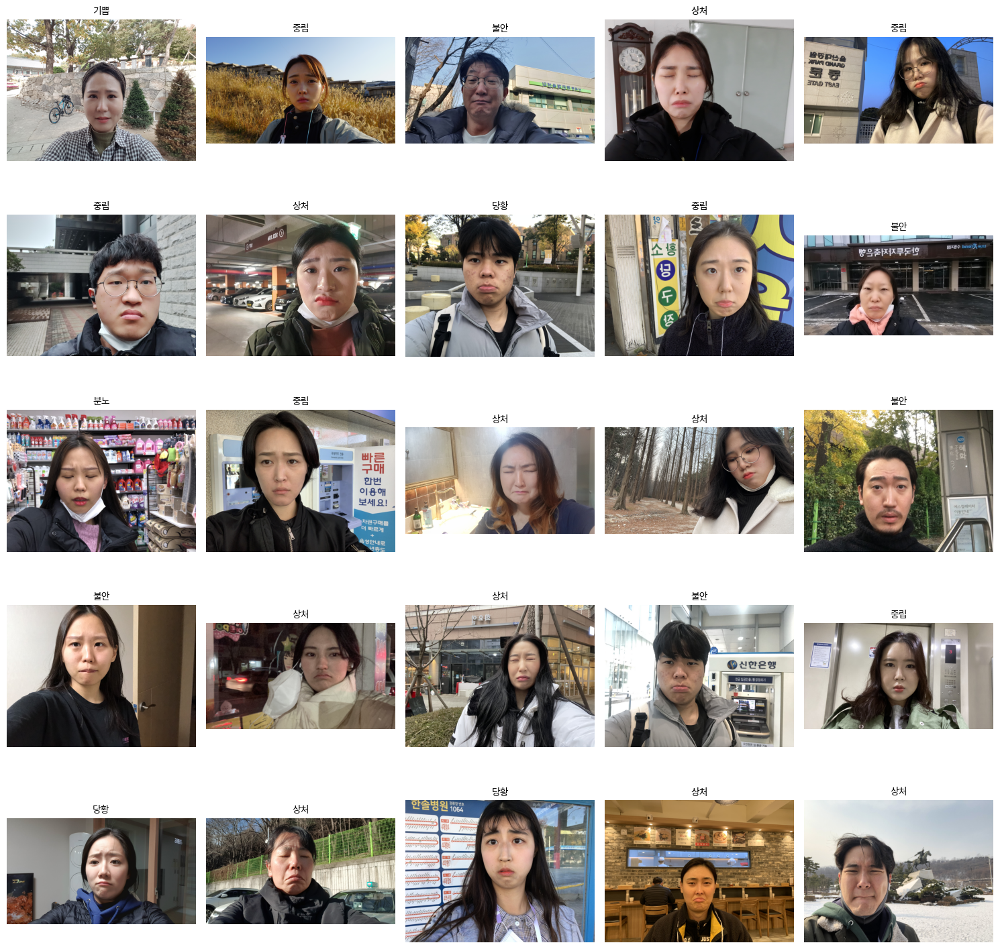

In [19]:
# 감정 정보가 다른 이미지 시각화
unique_filenames = df_train_not_sadness['filename'].unique()

plt.figure(figsize=(15, 15))

for i, filename in enumerate(unique_filenames):
    if i >= 25:  # Show only the first 25 images for this example
        break
    image_path = os.path.join(train_img_path, 'sadness', filename)
    if os.path.exists(image_path):  # Ensure the file exists
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.subplot(5, 5, i + 1)
        plt.imshow(image)
        faceExp = df_train_not_sadness[df_train_not_sadness['filename'] == filename]['faceExp'].iloc[0]
        plt.title(faceExp, fontproperties=fontprop)
        plt.axis('off')

plt.tight_layout()
plt.show()

##### 연령, 성별, 전문인 column 분포 확인

In [20]:
# 연령 분포 확인
df_train_sadness['age'].value_counts()

age
20    2301
30    1401
40     639
50      93
10      63
60       3
Name: count, dtype: int64

In [21]:
# 성별 분포 확인
df_train_sadness['gender'].value_counts()

gender
여    2514
남    1986
Name: count, dtype: int64

In [22]:
# 전문인 여부
df_train_sadness['isProf'].value_counts()

isProf
일반인    2436
전문인    2064
Name: count, dtype: int64

##### 배경 정보 확인
- bg_uploader와 bg 차이 확인
- 배경 정보가 다른 이미지들 어떻게 처리할지

In [23]:
# 배경 정보
df_train_sadness['bg_uploader'].value_counts(), df_train_sadness['bg'].value_counts()

(bg_uploader
 숙박 및 거주공간            867
 상업시설/점포/시장           693
 도심 환경                552
 공공시설/종교/의료시설         522
 교통/이동수단(엘리베이터 포함)    471
 실외 자연환경              459
 문화재 및 유적지            255
 오락/공연시설              249
 행사/사무공간              219
 스포츠 관람 및 레저시설        213
 Name: count, dtype: int64,
 bg
 숙박 및 거주공간            855
 상업시설/점포/시장           805
 공공시설/종교/의료           622
 도심 환경                545
 실외 자연환경              481
 교통/이동수단(엘리베이터 포함)    389
 행사/사무공간              240
 오락/공연시설              228
 문화재 및 유적지            157
 스포츠 관람 및 레저시설        157
 공공시설/종교/의료시설          21
 Name: count, dtype: int64)

##### 박스 좌표 정보 확인
- 한 이미지 내 박스 좌표가 유사한지 시각화 및 좌표 수치 확인

Invalid SOS parameters for sequential JPEG


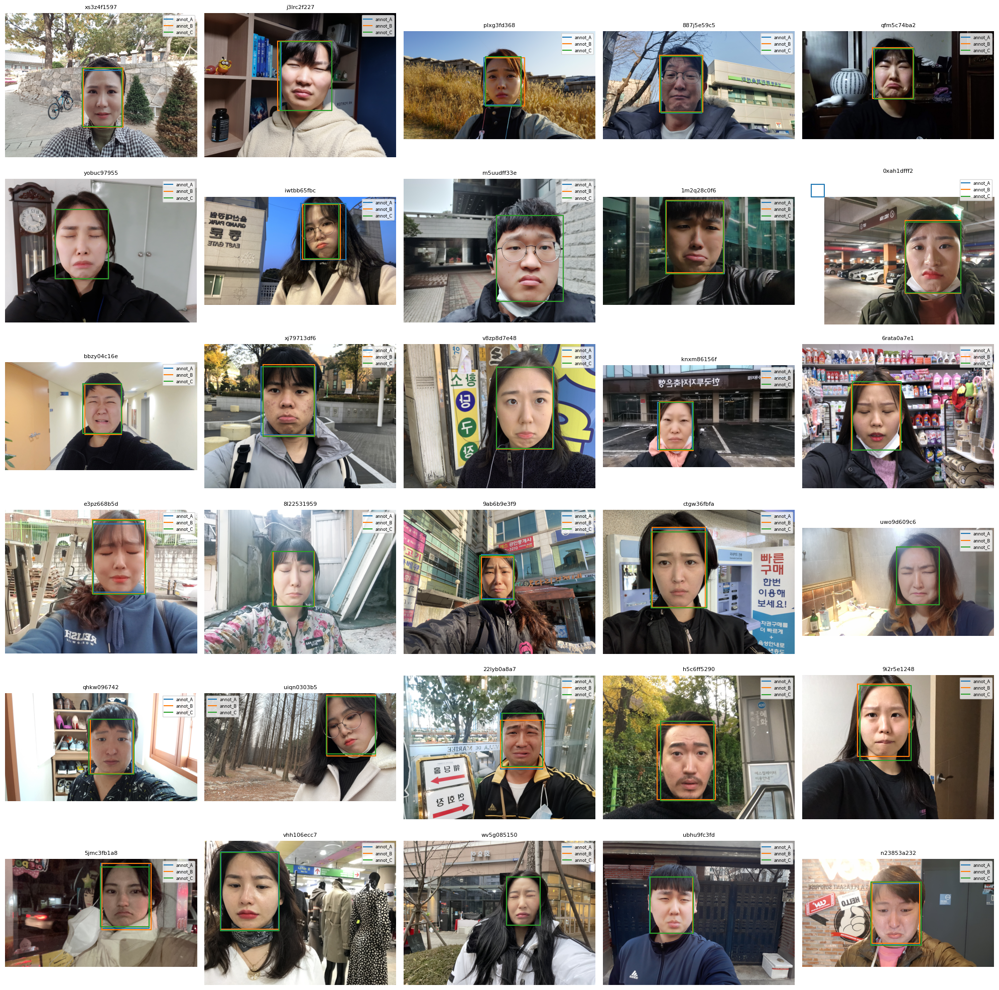

In [24]:
# 이미지 & 박스 시각화

def visualize_boxes(data, image_dir):
    data = data[:30]  # 30개 이미지만 시각화
    fig, axes = plt.subplots(6, 5, figsize=(20, 20))
    axes = axes.ravel()

    for idx, item in enumerate(data):
        filename = item['filename']
        image_path = os.path.join(image_dir, filename)

        if not os.path.exists(image_path):
            print(f"Image {filename} not found in directory {image_dir}.")
            continue

        # Load image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[idx].imshow(image) 
        axes[idx].axis('off')

        # Plot boxes from annotations
        for annot_key in ['annot_A', 'annot_B', 'annot_C']:
            if annot_key in item:
                box = item[annot_key]['boxes']
                x = [box['minX'], box['maxX'], box['maxX'], box['minX'], box['minX']]
                y = [box['minY'], box['minY'], box['maxY'], box['maxY'], box['minY']]
                axes[idx].plot(x, y, label=annot_key)

        axes[idx].set_title(filename[:10], fontsize=8)
        axes[idx].legend(fontsize=6)
       
    # Hide unused subplots
    for i in range(len(data), 30):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

visualize_boxes(json_sadness, sadness_img_path)

In [26]:
# 박스 좌표 수치 확인

# 임의로 10개의 파일 이름 선택
sample_filenames = df_train_sadness['filename'].drop_duplicates().sample(n=10)

# 선택된 파일 이름에 대한 그룹 생성
sample_groups = df_train_sadness[df_train_sadness['filename'].isin(sample_filenames)]

# 같은 파일 이름끼리 그룹화
grouped = sample_groups.groupby('filename')

# 그룹 내 좌표 출력
for filename, group in grouped:
    print(f"Filename: {filename}")
    
    # 그룹 내 각 annot의 좌표 정보 출력
    for idx, row in group.iterrows():
        annot = row['annot']
        min_x, min_y, max_x, max_y = row['minX'], row['minY'], row['maxX'], row['maxY']
        print(f"  Annot: {annot}")
        print(f"    MinX: {min_x}, MinY: {min_y}")
        print(f"    MaxX: {max_x}, MaxY: {max_y}")
    
    print("-" * 30)

Filename: 3qpu939af9425e0db9e7b39075594a92bae0eeb25909e5a5352bfbd2f955crrc7.jpg
  Annot: annot_A
    MinX: 568.225847543362, MinY: 516.7049826009229
    MaxX: 1349.4756002648571, MaxY: 1565.6694826009225
  Annot: annot_B
    MinX: 570.9123820486453, MinY: 502.0114999999995
    MaxX: 1355.337129868172, MaxY: 1550.9759999999997
  Annot: annot_C
    MinX: 544.83563, MinY: 502.0115
    MaxX: 1355.2439, MaxY: 1550.9760000000003
------------------------------
Filename: 6z6vcd101dde26c67d9f26f78fbd1bd586afcbac1b98ed7c6869ddcc6b5d6k7or.jpg
  Annot: annot_A
    MinX: 1704.4626000000003, MinY: 380.66024999999996
    MaxX: 2592.7935, MaxY: 1627.9323000000002
  Annot: annot_B
    MinX: 1677.629970832135, MinY: 369.91808629999883
    MaxX: 2550.0926418699482, MaxY: 1606.5820849471154
  Annot: annot_C
    MinX: 1685.6077831750338, MinY: 361.8054331750339
    MaxX: 2573.9386831750344, MaxY: 1609.0774831750339
------------------------------
Filename: cu7z5a4d8dbda467d4761dbdd70da1881d6d79120d4d548db10